In [21]:
#!pip install Pillow

In [22]:
import google.generativeai as genai
api_key = ''
genai.configure(api_key=api_key)

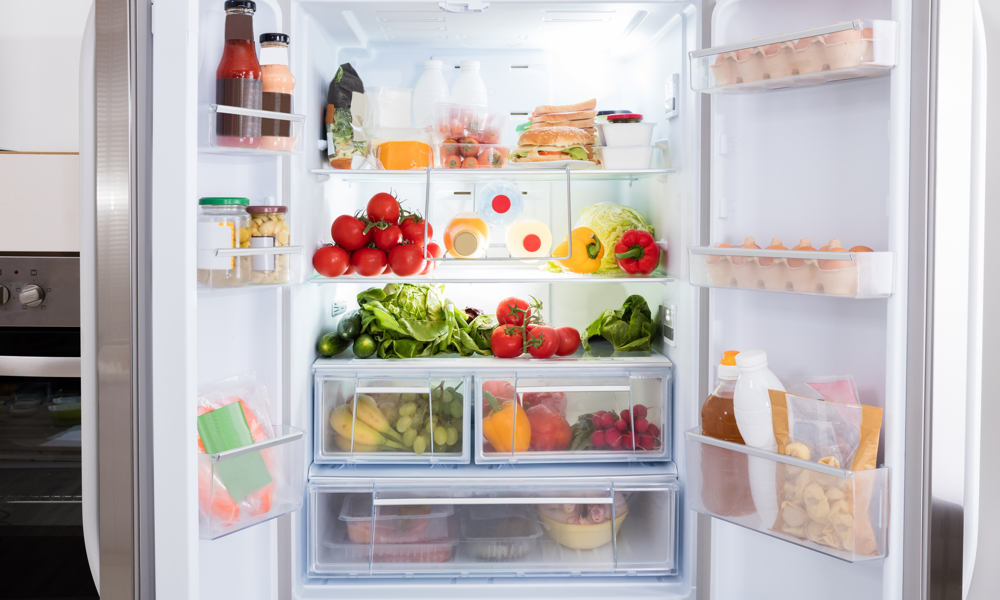

In [23]:
import PIL
img = PIL.Image.open('Fridge_Picture.jpg')
img

In [24]:
for model in genai.list_models():
    print(model.name)

models/chat-bison-001
models/text-bison-001
models/embedding-gecko-001
models/gemini-1.0-pro-latest
models/gemini-1.0-pro
models/gemini-pro
models/gemini-1.0-pro-001
models/gemini-1.0-pro-vision-latest
models/gemini-pro-vision
models/gemini-1.5-pro-latest
models/gemini-1.5-pro-001
models/gemini-1.5-pro
models/gemini-1.5-pro-exp-0801
models/gemini-1.5-flash-latest
models/gemini-1.5-flash-001
models/gemini-1.5-flash
models/gemini-1.5-flash-001-tuning
models/embedding-001
models/text-embedding-004
models/aqa


# Image Description

To have Gemini simply describe an image, you just need to pass in the image, no additional text is needed.

In [25]:
model = genai.GenerativeModel('gemini-1.5-flash')

In [26]:
response = model.generate_content(img)

In [27]:
response.text

'This image shows a well-stocked refrigerator with a variety of food items. The refrigerator is white and has a glass door. The refrigerator is open, revealing the shelves and drawers inside. The shelves are filled with food items, such as tomatoes, lettuce, cucumbers, bananas, grapes, and red radishes. There are also some containers of food, such as milk, cheese, and yogurt. The drawers are filled with food items, such as a whole chicken and a container of pasta. The door of the refrigerator is open, revealing a shelf that is filled with eggs. There is also a container of food on the door, which appears to be some kind of pasta. The image is a close-up of the interior of the refrigerator, focusing on the food items that are stored there.  The image is well-lit and in focus, making it easy to see the different food items that are stored in the refrigerator.'

## Image and Text Prompt

To add additional text prompt, we pass in a list of the text prompt and the image. Note that Gemini-Vision-Pro is really meant for a single request that has the image, it is not optimized for ongoing conversation, which is why we use generate_content(). If you attempted to use this with chat, it would not understand what image you are referring to in the subsequent calls.

In [28]:
text_prompt = 'Create a recipe based on the food item available in the picture of the Fridge'
response = model.generate_content(contents=[text_prompt,img])

In [29]:
print(response.text)

## Chicken Tortellini Salad

This light and refreshing salad is perfect for a summer lunch or dinner. 

**Ingredients:**

* 1 package (14 ounces) chicken tortellini
* 1 head romaine lettuce, chopped
* 1/2 cup chopped red onion
* 1/2 cup chopped red bell pepper
* 1/2 cup chopped tomatoes
* 1/2 cup chopped radishes
* 1/4 cup chopped fresh basil
* 1/4 cup olive oil
* 2 tablespoons lemon juice
* 1 teaspoon salt
* 1/2 teaspoon black pepper
* 1/4 cup grated Parmesan cheese

**Instructions:**

1. Cook the tortellini according to the package directions. Drain and rinse with cold water.
2. In a large bowl, combine the tortellini, lettuce, red onion, bell pepper, tomatoes, radishes, and basil.
3. In a small bowl, whisk together the olive oil, lemon juice, salt, and pepper. Pour over the salad and toss to coat.
4. Sprinkle with Parmesan cheese and serve. 



In [30]:
text_prompt = 'Do i have tomatoes in the Fridge? where? how much?'
response = model.generate_content(contents=[text_prompt,img])
print(response.text)

Yes, there are tomatoes in the fridge, on the second shelf from the top. There are about 10 tomatoes.


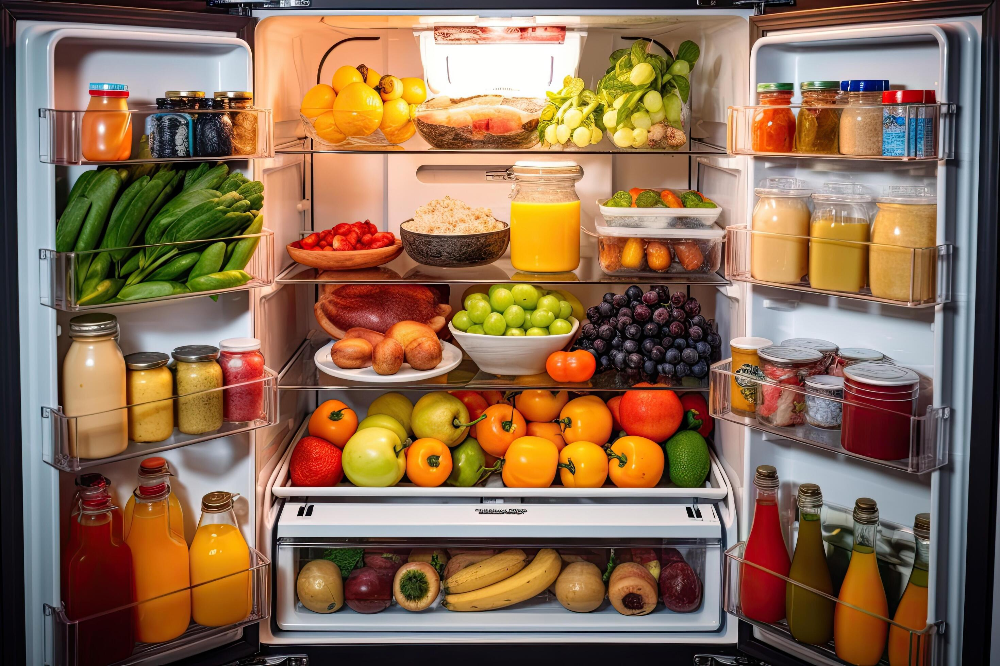

In [31]:
img1 = PIL.Image.open('Fridge.jpg')
img1

In [32]:
response = model.generate_content(img1)
print(response.text)

This is a well-stocked fridge! It's full of fresh fruits and vegetables, as well as a variety of juices and sauces. It looks like this person has a healthy diet!

Here's a breakdown of what I see:

* **Top Shelf:**  There are a few different types of fruits, including persimmons, grapes, and some unknown red fruit. 
* **Second Shelf:** Several jars of condiments and sauces, including a jar of mustard, a jar of pickles, and a jar of something blue. 
* **Third Shelf:**  Green beans or asparagus, and a jar of orange juice.
* **Fourth Shelf:** Various jars of sauces and condiments, including some jars of mustard, ketchup, and relishes.
* **Fifth Shelf:** A variety of fruits and vegetables, including tomatoes, apples, limes, oranges, and other unknown fruits.
* **Sixth Shelf:** A jar of orange juice, and some jars of condiments or sauces.
* **Seventh Shelf:** A variety of fruits and vegetables, including bananas, pears, and some type of red fruit.
* **Bottom Shelf:** A variety of juices, in

In [33]:
text_prompt = 'Create a recipe based on the food item available in the picture of the Fridge'
response = model.generate_content(contents=[text_prompt,img1])
print(response.text)

##  Orange-Grapefruit Smoothie with Toasted Coconut

This vibrant smoothie is packed with flavor and nutrients from the fresh ingredients in your fridge.

**Ingredients:**

* 1 cup orange juice (from your fridge)
* 1/2 cup grapefruit juice (from your fridge)
* 1/2 cup frozen grapes (from your fridge)
* 1/4 cup unsweetened shredded coconut (from your fridge)
* 1/2 teaspoon vanilla extract
* 1/4 teaspoon ground cinnamon
* Optional: a few ice cubes

**Instructions:**

1. Place the shredded coconut in a dry skillet over medium heat.
2. Toast the coconut, stirring occasionally, until golden brown and fragrant (about 2-3 minutes).
3. Let the toasted coconut cool slightly.
4. In a blender, combine the orange juice, grapefruit juice, frozen grapes, toasted coconut, vanilla extract, and cinnamon.
5. Blend until smooth.
6. If desired, add a few ice cubes to make it extra refreshing.
7. Pour into glasses and enjoy!

**Tips:**

* For a thicker smoothie, add a banana to the blend.
* Adjust the amou

In [34]:
text_prompt = 'What type of fruit do i have in the fridge? where? how much?'
response = model.generate_content(contents=[text_prompt,img1])
print(response.text)

The fridge contains:
- **Oranges:** on the top shelf, about 10.
- **Tomatoes:** on the 4th shelf, about 10.
- **Bananas:** on the bottom shelf, about 6.
- **Apples:** on the 4th shelf, about 5.
- **Green grapes:** on the 3rd shelf, about 1 cup.
- **Red grapes:** on the 3rd shelf, about 1 cup. 



In [35]:
text_prompt = 'Create a recipe for lunch based on the food item available in the picture of the Fridge'
response = model.generate_content(contents=[text_prompt,img1])
print(response.text)

##  Fruity Salad with  Yogurt Dressing

**Ingredients:**

*  **Fruits:**
    * 1 cup of Grapes (purple or green)
    * 1/2 cup of Orange Slices
    * 1/2 cup of  yellow  Peaches (sliced)
    * 1 banana (sliced)
* **Yogurt Dressing:**
    * 1/2 cup Plain yogurt
    * 1 tablespoon Honey
    * 1/2 teaspoon Lemon juice
    *  Pinch of cinnamon 

**Instructions:**

1. Combine all fruits in a bowl.
2. In a separate bowl, whisk together yogurt, honey, lemon juice and cinnamon.
3. Pour yogurt dressing over the fruit salad and mix gently.
4. Enjoy your fresh and healthy lunch!

**Tips:**
* You can add other fruits you find in the fridge, such as apples or berries.
* If you don't have honey, you can use sugar or maple syrup.
* You can also add chopped nuts or seeds for extra crunch.

**Enjoy your delicious lunch!**


In [36]:
text_prompt = 'Do i have vegetables in the fridge?'
response = model.generate_content(contents=[text_prompt,img1])
print(response.text)

Yes, there are many vegetables in the fridge, such as green beans, grapes, tomatoes, apples, and a few more.


In [37]:
text_prompt = 'Do i have cucumber in the Fridge?'
response = model.generate_content(contents=[text_prompt,img1])
print(response.text)

No, there is no cucumber in the fridge.
